# **LSTM Deep Learning Model – Soil Moisture Prediction**

In [1]:
# ======================================
# LSTM for Soil Moisture Prediction
# Fully Clean & Error-Safe Version
# ======================================

# ---------- Suppress TensorFlow log noise ----------
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

# ---------- Imports ----------
import pandas as pd
import numpy as np
import glob
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from tensorflow.keras.callbacks import EarlyStopping

# ---------- Load Dataset ----------
dataset_path = "/kaggle/input/datasets/sathyanarayanrao89/soil-moisture-data-from-field-scale-sensor-network"
hourly_files = glob.glob(dataset_path + "/Hourly/*.txt")

if len(hourly_files) == 0:
    raise ValueError("No hourly files found. Check dataset path.")

def load_and_combine(files):
    dfs = []
    for f in files:
        try:
            df = pd.read_csv(f, sep='\t', engine='python')
            dfs.append(df)
        except Exception as e:
            print(f"Skipping {f} due to error: {e}")
    if len(dfs) == 0:
        raise ValueError("No files could be loaded.")
    return pd.concat(dfs, ignore_index=True)

hourly_df = load_and_combine(hourly_files)

# ---------- Basic Cleaning ----------
hourly_df.replace([np.inf, -np.inf], np.nan, inplace=True)
hourly_df.ffill(inplace=True)
hourly_df.bfill(inplace=True)

# ---------- Safe Datetime Conversion ----------
for col in hourly_df.columns:
    if 'time' in col.lower() or 'date' in col.lower():
        hourly_df[col] = pd.to_datetime(hourly_df[col], errors='coerce')

# ---------- Feature Selection ----------
target_col = 'VW_30cm'

if target_col not in hourly_df.columns:
    raise ValueError(f"{target_col} not found in dataset.")

hourly_df.dropna(subset=[target_col], inplace=True)

feature_cols = [
    c for c in hourly_df.columns
    if c not in ['Date', 'Time', 'Location', target_col]
    and np.issubdtype(hourly_df[c].dtype, np.number)
]

if len(feature_cols) == 0:
    raise ValueError("No numeric feature columns found.")

X = hourly_df[feature_cols].values
y = hourly_df[target_col].values.reshape(-1, 1)

# ---------- Scaling ----------
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y)

# ---------- Create Sequences ----------
TIME_STEPS = 24

def create_sequences(X, y, steps):
    X_seq, y_seq = [], []
    for i in range(len(X) - steps):
        X_seq.append(X[i:i+steps])
        y_seq.append(y[i+steps])
    return np.array(X_seq), np.array(y_seq)

X_seq, y_seq = create_sequences(X_scaled, y_scaled, TIME_STEPS)

if len(X_seq) == 0:
    raise ValueError("Not enough data to create sequences.")

# ---------- Remove NaNs if any ----------
mask = ~np.isnan(y_seq).flatten()
X_seq = X_seq[mask]
y_seq = y_seq[mask]

# ---------- Optional Stratified Split ----------
try:
    y_bins = pd.qcut(y_seq.flatten(), q=5, labels=False, duplicates='drop')
    X_train, X_test, y_train, y_test = train_test_split(
        X_seq, y_seq, test_size=0.2, random_state=42, stratify=y_bins
    )
except:
    X_train, X_test, y_train, y_test = train_test_split(
        X_seq, y_seq, test_size=0.2, random_state=42
    )

# ---------- Build LSTM Model ----------
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(64, return_sequences=True),
    Dropout(0.2),
    LSTM(32),
    Dropout(0.2),
    Dense(1)
])

model.compile(optimizer='adam', loss='mse')

# ---------- Early Stopping ----------
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

# ---------- Train ----------
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=15,
    batch_size=32,
    callbacks=[early_stop],
    verbose=1
)

# ---------- Predict ----------
y_pred_scaled = model.predict(X_test)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_true = scaler_y.inverse_transform(y_test)

# ---------- Sample Output ----------
print("\nSample Predictions:\n")
for i in range(min(5, len(y_pred))):
    print(f"Predicted: {y_pred[i][0]:.4f} | Actual: {y_true[i][0]:.4f}")


E0000 00:00:1771079014.046642     111 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1771079014.053498     111 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1771079014.070583     111 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771079014.070608     111 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771079014.070611     111 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1771079014.070613     111 computation_placer.cc:177] computation placer already registered. Please check linka

Epoch 1/15


I0000 00:00:1771079074.290705     169 cuda_dnn.cc:529] Loaded cuDNN version 91002


84341/84341 ━━━━━━━━━━━━━━━━━━━━ 563s 7ms/step - loss: 0.0018 - val_loss: 5.4526e-04
Epoch 2/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 551s 7ms/step - loss: 5.9456e-04 - val_loss: 3.6852e-04
Epoch 3/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 552s 7ms/step - loss: 4.1624e-04 - val_loss: 2.5462e-04
Epoch 4/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 554s 7ms/step - loss: 3.5125e-04 - val_loss: 2.2535e-04
Epoch 5/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 554s 7ms/step - loss: 3.1763e-04 - val_loss: 1.9566e-04
Epoch 6/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 554s 7ms/step - loss: 2.9861e-04 - val_loss: 1.8333e-04
Epoch 7/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 554s 7ms/step - loss: 2.7187e-04 - val_loss: 1.8462e-04
Epoch 8/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 553s 7ms/step - loss: 2.5878e-04 - val_loss: 1.8666e-04
Epoch 9/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 553s 7ms/step - loss: 2.4544e-04 - val_loss: 1.6585e-04
Epoch 10/15
84341/84341 ━━━━━━━━━━━━━━━━━━━━ 554s 7ms/step - loss: 2.3698e-04 - val_loss: 1.6092e-04
Epoch 11/15
84

# **Data Description:**

In [10]:
# -------------------------------
# Hourly Dataset Inspection
# -------------------------------

print("============ Hourly Dataset Info ============")
display(hourly_df.info())   # data types and missing values

print("Missing values per column:")
display(hourly_df.isnull().sum())

print("\n============ Hourly Dataset Statistics ============")
display(hourly_df.describe())  # check ranges for scaling

# Target columns
target_cols = ['VW_30cm', 'VW_60cm', 'VW_90cm', 'VW_120cm', 'VW_150cm']

print("\nTarget Column Ranges (Hourly):")
display(hourly_df[target_cols].describe())

# -------------------------------
# Feature-target correlation (numeric only)
# -------------------------------

# Select numeric columns
numeric_cols = hourly_df.select_dtypes(include='number').columns
# Filter target columns that are numeric
target_numeric = [c for c in target_cols if c in numeric_cols]

print("\nFeature-Target Correlation (Hourly, numeric only):")
display(hourly_df[numeric_cols].corr()[target_numeric])

# -------------------------------
# Daily Dataset Safe Check
# -------------------------------

try:
    print("\n============ Daily Dataset Info ============")
    display(daily_df.info())
    print("Missing values per column:")
    display(daily_df.isnull().sum())

    print("\n============ Daily Dataset Statistics ============")
    display(daily_df.describe())
except NameError:
    print("\nDaily dataset not defined. Skipping daily dataset inspection.")


============ Hourly Dataset Info ============
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3373658 entries, 0 to 3373657
Data columns (total 13 columns):
 #   Column    Dtype         
---  ------    -----         
 0   Location  object        
 1   Date      datetime64[ns]
 2   Time      datetime64[ns]
 3   VW_30cm   float64       
 4   VW_60cm   float64       
 5   VW_90cm   float64       
 6   VW_120cm  float64       
 7   VW_150cm  float64       
 8   T_30cm    float64       
 9   T_60cm    float64       
 10  T_90cm    float64       
 11  T_120cm   float64       
 12  T_150cm   float64       
dtypes: datetime64[ns](2), float64(10), object(1)
memory usage: 334.6+ MB


None

Missing values per column:


Location    0
Date        0
Time        0
VW_30cm     0
VW_60cm     0
VW_90cm     0
VW_120cm    0
VW_150cm    0
T_30cm      0
T_60cm      0
T_90cm      0
T_120cm     0
T_150cm     0
dtype: int64


============ Hourly Dataset Statistics ============


,Date,Time,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm,T_30cm,T_60cm,T_90cm,T_120cm,T_150cm
count,3373658,3373658,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06
mean,2011-11-17 22:35:21.398198272,2026-02-14 11:30:10.921665792,2.552432e-01,2.911156e-01,3.136964e-01,3.356245e-01,3.470591e-01,1.176619e+01,1.119182e+01,1.080492e+01,1.059972e+01,1.042606e+01
min,2007-04-20 00:00:00,2026-02-14 00:00:00,7.700000e-02,4.000000e-03,6.100000e-02,9.300000e-02,7.400000e-02,-9.100000e+00,-7.000000e+00,-7.100000e+00,-2.800000e+00,6.000000e-01
25%,2009-08-03 00:00:00,2026-02-14 06:00:00,2.050000e-01,2.180000e-01,2.360000e-01,2.580000e-01,2.760000e-01,5.600000e+00,6.200000e+00,6.500000e+00,7.000000e+00,7.200000e+00
50%,2011-11-18 00:00:00,2026-02-14 12:00:00,2.370000e-01,2.830000e-01,3.110000e-01,3.400000e-01,3.460000e-01,1.310000e+01,1.190000e+01,1.130000e+01,1.100000e+01,1.080000e+01
75%,2014-03-04 00:00:00,2026-02-14 18:00:00,3.050000e-01,3.530000e-01,3.970000e-01,4.060000e-01,4.150000e-01,1.740000e+01,1.560000e+01,1.470000e+01,1.380000e+01,1.310000e+01
max,2016-06-16 00:00:00,2026-02-14 23:00:00,1.010000e+00,6.520000e-01,6.090000e-01,6.310000e-01,6.140000e-01,2.900000e+01,2.340000e+01,2.110000e+01,2.480000e+01,2.530000e+01
std,NaN,NaN,7.485716e-02,9.472690e-02,9.487843e-02,9.390281e-02,9.513127e-02,6.505318e+00,5.333300e+00,4.579035e+00,3.922559e+00,3.519553e+00



Target Column Ranges (Hourly):


,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm
count,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06,3.373658e+06
mean,2.552432e-01,2.911156e-01,3.136964e-01,3.356245e-01,3.470591e-01
std,7.485716e-02,9.472690e-02,9.487843e-02,9.390281e-02,9.513127e-02
min,7.700000e-02,4.000000e-03,6.100000e-02,9.300000e-02,7.400000e-02
25%,2.050000e-01,2.180000e-01,2.360000e-01,2.580000e-01,2.760000e-01
50%,2.370000e-01,2.830000e-01,3.110000e-01,3.400000e-01,3.460000e-01
75%,3.050000e-01,3.530000e-01,3.970000e-01,4.060000e-01,4.150000e-01
max,1.010000e+00,6.520000e-01,6.090000e-01,6.310000e-01,6.140000e-01



Feature-Target Correlation (Hourly, numeric only):


,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm
VW_30cm,1.000000,0.622828,0.447626,0.296894,0.271748
VW_60cm,0.622828,1.000000,0.589014,0.413713,0.441001
VW_90cm,0.447626,0.589014,1.000000,0.567232,0.434157
VW_120cm,0.296894,0.413713,0.567232,1.000000,0.601593
VW_150cm,0.271748,0.441001,0.434157,0.601593,1.000000
T_30cm,-0.458444,-0.198398,-0.114729,-0.071585,-0.012161
T_60cm,-0.477233,-0.329577,-0.203701,-0.089300,-0.051118
T_90cm,-0.500717,-0.347875,-0.275006,-0.084795,-0.062489
T_120cm,-0.490649,-0.311372,-0.200535,-0.171390,-0.118136
T_150cm,-0.505099,-0.368610,-0.280439,-0.162056,-0.193205



============ Daily Dataset Info ============

Daily dataset not defined. Skipping daily dataset inspection.


# **Data Cleaning Using Deep Learning:**

In [12]:
# ======================================
# Final Soil Moisture Cleaning + Daily Aggregation Pipeline
# ======================================

import pandas as pd

def clean_soil_data(df, display_info=True):
    """
    Clean soil moisture dataset:
    - Standardize column names
    - Remove empty/duplicate rows
    - Convert date/time columns to datetime
    - Convert numeric columns
    - Fill missing values
    - Sort by datetime
    """
    # 1. Clean column names
    df.columns = (
        df.columns
        .str.strip()
        .str.lower()
        .str.replace(" ", "_")
        .str.replace(r"[^\w]", "", regex=True)
    )

    # 2. Remove empty rows
    df.dropna(how="all", inplace=True)

    # 3. Remove duplicate rows
    df.drop_duplicates(inplace=True)

    # 4. Convert time/date columns to datetime
    for col in df.columns:
        if "time" in col or "date" in col:
            df[col] = pd.to_datetime(df[col], errors="coerce")

    # 5. Convert numeric columns
    for col in df.columns:
        if df[col].dtype == "object" and not any(x in col for x in ["date", "time"]):
            df[col] = pd.to_numeric(df[col], errors="coerce")

    # 6. Fill missing values
    df.ffill(inplace=True)
    df.bfill(inplace=True)

    # 7. Sort by datetime if available
    time_cols = [c for c in df.columns if "time" in c or "date" in c]
    if time_cols:
        df.sort_values(by=time_cols[0], inplace=True)

    df.reset_index(drop=True, inplace=True)

    # 8. Display basic info
    if display_info:
        print("Dataset shape:", df.shape)
        display(df.head())
        display(df.describe())
        print("Missing values per column:")
        display(df.isnull().sum())

    return df

# -------------------------------
# 1. Clean hourly dataset
# -------------------------------
hourly_df = clean_soil_data(hourly_df)

# -------------------------------
# 2. Create daily dataset from hourly
# -------------------------------
daily_df = (
    hourly_df
    .groupby('date')  # aggregate by date
    .agg({
        'vw_30cm': 'mean',
        'vw_60cm': 'mean',
        'vw_90cm': 'mean',
        'vw_120cm': 'mean',
        'vw_150cm': 'mean',
        't_30cm': 'mean',
        't_60cm': 'mean',
        't_90cm': 'mean',
        't_120cm': 'mean',
        't_150cm': 'mean',
        'location': 'first'  # take first available location
    })
    .reset_index()
)

# 3. Clean daily dataset safely
daily_df = clean_soil_data(daily_df)

# -------------------------------
# 4. Check target column ranges
# -------------------------------
target_cols_hourly = [c for c in hourly_df.columns if "vw" in c]
print("\nTarget column ranges (hourly):")
display(hourly_df[target_cols_hourly].describe())

target_cols_daily = [c for c in daily_df.columns if "vw" in c]
print("\nTarget column ranges (daily):")
display(daily_df[target_cols_daily].describe())


Dataset shape: (3372768, 13)


,location,date,time,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm
0,NaN,2007-04-20,2026-02-14 00:00:00,0.394,0.420,0.232,0.151,0.185,16.0,9.9,8.5,8.0,7.8
1,NaN,2007-04-20,2026-02-14 20:00:00,0.191,0.221,0.217,0.223,0.132,13.1,15.5,12.2,11.8,8.0
2,NaN,2007-04-20,2026-02-14 21:00:00,0.191,0.221,0.217,0.223,0.132,13.1,15.5,12.2,11.8,8.0
3,NaN,2007-04-20,2026-02-14 22:00:00,0.191,0.221,0.217,0.223,0.132,13.1,15.5,12.2,11.8,8.0
4,NaN,2007-04-20,2026-02-14 23:00:00,0.191,0.221,0.217,0.223,0.132,13.1,15.5,12.2,11.8,8.0


,location,date,time,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm
count,0.0,3372768,3372768,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06
mean,NaN,2011-11-17 12:00:00,2026-02-14 11:29:59.999997952,2.552551e-01,2.910813e-01,3.136591e-01,3.355885e-01,3.469931e-01,1.176521e+01,1.119094e+01,1.080405e+01,1.059877e+01,1.042556e+01
min,NaN,2007-04-20 00:00:00,2026-02-14 00:00:00,7.700000e-02,4.000000e-03,6.100000e-02,9.300000e-02,7.400000e-02,-9.100000e+00,-7.000000e+00,-7.100000e+00,-2.800000e+00,6.000000e-01
25%,NaN,2009-08-03 00:00:00,2026-02-14 05:45:00,2.050000e-01,2.180000e-01,2.360000e-01,2.580000e-01,2.760000e-01,5.600000e+00,6.200000e+00,6.500000e+00,7.000000e+00,7.200000e+00
50%,NaN,2011-11-17 12:00:00,2026-02-14 11:30:00,2.370000e-01,2.830000e-01,3.110000e-01,3.400000e-01,3.460000e-01,1.310000e+01,1.190000e+01,1.130000e+01,1.090000e+01,1.080000e+01
75%,NaN,2014-03-03 00:00:00,2026-02-14 17:15:00,3.050000e-01,3.530000e-01,3.970000e-01,4.060000e-01,4.150000e-01,1.740000e+01,1.560000e+01,1.470000e+01,1.380000e+01,1.310000e+01
max,NaN,2016-06-16 00:00:00,2026-02-14 23:00:00,1.010000e+00,6.520000e-01,6.090000e-01,6.310000e-01,6.140000e-01,2.900000e+01,2.340000e+01,2.110000e+01,2.480000e+01,2.530000e+01
std,NaN,NaN,NaN,7.486343e-02,9.471589e-02,9.486317e-02,9.388905e-02,9.505713e-02,6.505893e+00,5.333733e+00,4.579327e+00,3.922641e+00,3.519886e+00


Missing values per column:


location    3372768
date              0
time              0
vw_30cm           0
vw_60cm           0
vw_90cm           0
vw_120cm          0
vw_150cm          0
t_30cm            0
t_60cm            0
t_90cm            0
t_120cm           0
t_150cm           0
dtype: int64

Dataset shape: (3346, 12)


,date,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm,location
0,2007-04-20,0.235770,0.292321,0.325345,0.346498,0.351891,12.867560,12.531151,12.013988,11.191071,10.821726,NaN
1,2007-04-21,0.239368,0.296035,0.327103,0.349431,0.353853,12.782837,12.426885,11.985913,11.106944,10.778571,NaN
2,2007-04-22,0.239336,0.295967,0.327097,0.349430,0.353855,12.794246,12.431052,11.988095,11.107143,10.778770,NaN
3,2007-04-23,0.239323,0.295926,0.327107,0.349431,0.353857,12.806151,12.435813,11.989980,11.107242,10.780952,NaN
4,2007-04-24,0.239273,0.295880,0.327103,0.349439,0.353855,12.820040,12.442063,11.992659,11.109524,10.780952,NaN


,date,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm,location
count,3346,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000,0.0
mean,2011-11-17 12:00:00,0.255255,0.291081,0.313659,0.335589,0.346993,11.765205,11.190945,10.804054,10.598769,10.425562,NaN
min,2007-04-20 00:00:00,0.181165,0.190837,0.221157,0.256307,0.278159,1.654067,3.087798,3.934028,4.593254,5.287599,NaN
25%,2009-08-03 06:00:00,0.230801,0.260563,0.275454,0.301477,0.323886,7.387376,7.518006,7.786186,8.103671,8.414137,NaN
50%,2011-11-17 12:00:00,0.260163,0.305430,0.326210,0.344754,0.357053,11.942857,11.519048,10.864286,10.663294,10.407292,NaN
75%,2014-03-02 18:00:00,0.284230,0.330749,0.350123,0.365500,0.367026,16.491766,14.942560,14.029985,13.332961,12.622470,NaN
max,2016-06-16 00:00:00,0.350420,0.365629,0.377361,0.394624,0.403428,20.923016,18.353869,16.725198,15.861706,14.790873,NaN
std,NaN,0.038761,0.046629,0.042935,0.037348,0.030704,5.168812,4.254881,3.579649,3.007786,2.436683,NaN


Missing values per column:


date           0
vw_30cm        0
vw_60cm        0
vw_90cm        0
vw_120cm       0
vw_150cm       0
t_30cm         0
t_60cm         0
t_90cm         0
t_120cm        0
t_150cm        0
location    3346
dtype: int64


Target column ranges (hourly):


,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm
count,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06,3.372768e+06
mean,2.552551e-01,2.910813e-01,3.136591e-01,3.355885e-01,3.469931e-01
std,7.486343e-02,9.471589e-02,9.486317e-02,9.388905e-02,9.505713e-02
min,7.700000e-02,4.000000e-03,6.100000e-02,9.300000e-02,7.400000e-02
25%,2.050000e-01,2.180000e-01,2.360000e-01,2.580000e-01,2.760000e-01
50%,2.370000e-01,2.830000e-01,3.110000e-01,3.400000e-01,3.460000e-01
75%,3.050000e-01,3.530000e-01,3.970000e-01,4.060000e-01,4.150000e-01
max,1.010000e+00,6.520000e-01,6.090000e-01,6.310000e-01,6.140000e-01



Target column ranges (daily):


,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm
count,3346.000000,3346.000000,3346.000000,3346.000000,3346.000000
mean,0.255255,0.291081,0.313659,0.335589,0.346993
std,0.038761,0.046629,0.042935,0.037348,0.030704
min,0.181165,0.190837,0.221157,0.256307,0.278159
25%,0.230801,0.260563,0.275454,0.301477,0.323886
50%,0.260163,0.305430,0.326210,0.344754,0.357053
75%,0.284230,0.330749,0.350123,0.365500,0.367026
max,0.350420,0.365629,0.377361,0.394624,0.403428


# **Data Pre-Processing:**

In [13]:
# ======================================
# Soil Moisture Dataset Pre-Processing (DL-Ready)
# ======================================

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

def preprocess_soil_data(df):
    """
    Preprocess soil moisture dataset for deep learning.

    Steps:
    1. Extract time features (year, month, day, hour) if datetime column exists
    2. Select numeric columns
    3. Handle remaining NaNs (fill with median)
    4. Clip outliers using Interquartile Range (IQR)
    5. Remove constant columns (zero variance)
    6. Scale numeric features using StandardScaler

    Returns:
    - df: processed dataframe
    - numeric_cols: list of numeric columns used
    - scaler: fitted StandardScaler
    """
    df = df.copy()

    # 1. Identify datetime column
    time_cols = [c for c in df.columns if "time" in c.lower() or "date" in c.lower()]
    time_col = time_cols[0] if time_cols else None

    # 2. Extract time-based features
    if time_col:
        df["year"]  = df[time_col].dt.year
        df["month"] = df[time_col].dt.month
        df["day"]   = df[time_col].dt.day
        df["hour"]  = df[time_col].dt.hour

    # 3. Select numeric columns
    numeric_cols = df.select_dtypes(include=["int64", "float64"]).columns.tolist()

    # 4. Handle NaNs by filling with column median
    df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())

    # 5. Clip outliers using IQR
    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df[col] = np.clip(df[col], lower, upper)

    # 6. Remove constant columns (zero variance)
    constant_cols = [col for col in numeric_cols if df[col].nunique() <= 1]
    numeric_cols = [col for col in numeric_cols if col not in constant_cols]

    # 7. Scale numeric features
    scaler = StandardScaler()
    df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

    return df, numeric_cols, scaler

# -----------------------------
# Apply preprocessing
# -----------------------------
hourly_processed, hourly_numeric, hourly_scaler = preprocess_soil_data(hourly_df)
daily_processed, daily_numeric, daily_scaler = preprocess_soil_data(daily_df)

# -----------------------------
# Check results
# -----------------------------
print("Hourly processed shape:", hourly_processed.shape)
print("Daily processed shape:", daily_processed.shape)

display(hourly_processed.head())
display(daily_processed.head())


Hourly processed shape: (3372768, 17)
Daily processed shape: (3346, 16)


,location,date,time,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm,year,month,day,hour
0,NaN,2007-04-20,2026-02-14 00:00:00,1.926774,1.366398,-0.860809,-1.966516,-1.704166,0.650917,-0.242034,-0.503143,-0.662508,-0.746527,2007,4,20,0
1,NaN,2007-04-20,2026-02-14 20:00:00,-0.878292,-0.741459,-1.018932,-1.199426,-2.261726,0.205167,0.807887,0.304837,0.306235,-0.689633,2007,4,20,0
2,NaN,2007-04-20,2026-02-14 21:00:00,-0.878292,-0.741459,-1.018932,-1.199426,-2.261726,0.205167,0.807887,0.304837,0.306235,-0.689633,2007,4,20,0
3,NaN,2007-04-20,2026-02-14 22:00:00,-0.878292,-0.741459,-1.018932,-1.199426,-2.261726,0.205167,0.807887,0.304837,0.306235,-0.689633,2007,4,20,0
4,NaN,2007-04-20,2026-02-14 23:00:00,-0.878292,-0.741459,-1.018932,-1.199426,-2.261726,0.205167,0.807887,0.304837,0.306235,-0.689633,2007,4,20,0


,date,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm,location,year,month,day,hour
0,2007-04-20,-0.502782,0.026599,0.272227,0.292149,0.159540,0.213302,0.315028,0.338054,0.196952,0.162608,NaN,2007,4,20,0
1,2007-04-21,-0.409936,0.106245,0.313177,0.370681,0.223461,0.196909,0.290519,0.330210,0.168979,0.144894,NaN,2007,4,21,0
2,2007-04-22,-0.410756,0.104798,0.313039,0.370654,0.223525,0.199116,0.291499,0.330820,0.169045,0.144976,NaN,2007,4,22,0
3,2007-04-23,-0.411088,0.103905,0.313270,0.370681,0.223590,0.201420,0.292618,0.331346,0.169078,0.145872,NaN,2007,4,23,0
4,2007-04-24,-0.412394,0.102926,0.313177,0.370920,0.223525,0.204107,0.294087,0.332095,0.169836,0.145872,NaN,2007,4,24,0


# **Deep Learning EDA:**

Hourly sensor used: vw_30cm
Daily sensor used : vw_30cm


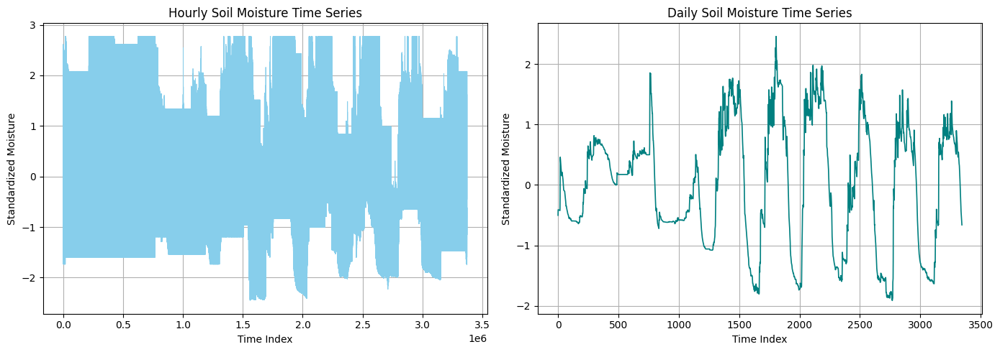


Hourly sensor statistics:


count    3.372768e+06
mean     1.063937e-15
std      1.000000e+00
min     -2.453550e+00
25%     -6.848388e-01
50%     -2.426610e-01
75%      6.969668e-01
max      2.769675e+00
Name: vw_30cm, dtype: float64


Daily sensor statistics:


count    3.346000e+03
mean     2.633213e-16
std      1.000149e+00
min     -1.911765e+00
25%     -6.310037e-01
50%      1.266431e-01
75%      7.476396e-01
max      2.455541e+00
Name: vw_30cm, dtype: float64

In [14]:
# ======================================
# Time-Series EDA for Deep Learning: Hourly vs Daily
# ======================================

import matplotlib.pyplot as plt

# ---------- Function to pick a numeric sensor column ----------
def pick_sensor(df, numeric_cols):
    """
    Pick the first numeric sensor column (excluding time features)
    from preprocessed numeric columns.
    """
    for col in numeric_cols:
        if col not in ["year", "month", "day", "hour"]:
            return col
    raise ValueError("No numeric sensor column found")

# ---------- Pick representative sensors ----------
hourly_sensor = pick_sensor(hourly_processed, hourly_numeric)
daily_sensor  = pick_sensor(daily_processed, daily_numeric)

print("Hourly sensor used:", hourly_sensor)
print("Daily sensor used :", daily_sensor)

# ---------- Side-by-side time series plot ----------
plt.figure(figsize=(14, 5))

# Hourly data
plt.subplot(1, 2, 1)
plt.plot(hourly_processed[hourly_sensor], linewidth=0.6, color='skyblue')
plt.title("Hourly Soil Moisture Time Series")
plt.xlabel("Time Index")
plt.ylabel("Standardized Moisture")
plt.grid(True)

# Daily data
plt.subplot(1, 2, 2)
plt.plot(daily_processed[daily_sensor], linewidth=1.2, color='teal')
plt.title("Daily Soil Moisture Time Series")
plt.xlabel("Time Index")
plt.ylabel("Standardized Moisture")
plt.grid(True)

plt.tight_layout()
plt.show()

# ---------- Optional: summary statistics ----------
print("\nHourly sensor statistics:")
display(hourly_processed[hourly_sensor].describe())

print("\nDaily sensor statistics:")
display(daily_processed[daily_sensor].describe())


# DL-Friendly KDE Plots: Soil Moisture by Season

Hourly sensor used: vw_30cm
Daily sensor used : vw_30cm


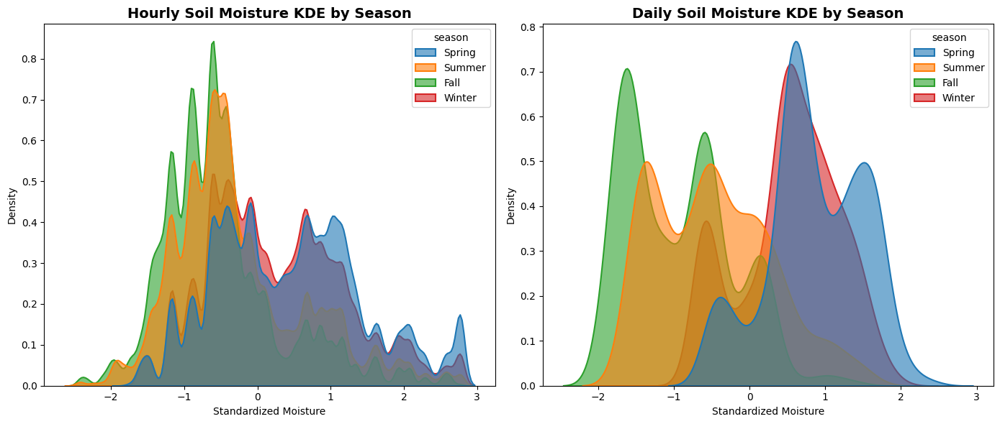

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Function to pick a numeric sensor column ----------
def pick_sensor(df, numeric_cols):
    """
    Pick the first numeric sensor column (excluding time features)
    """
    for col in numeric_cols:
        if col not in ["year", "month", "day", "hour"]:
            return col
    raise ValueError("No numeric sensor column found")

# Pick representative sensors
hourly_sensor = pick_sensor(hourly_processed, hourly_numeric)
daily_sensor  = pick_sensor(daily_processed, daily_numeric)

print("Hourly sensor used:", hourly_sensor)
print("Daily sensor used :", daily_sensor)

# ---------- Map months to seasons ----------
def month_to_season(month):
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    else:
        return "Fall"

hourly_processed["season"] = hourly_processed["month"].apply(month_to_season)
daily_processed["season"]  = daily_processed["month"].apply(month_to_season)

# ---------- KDE Plots ----------
plt.figure(figsize=(14, 6))

# Hourly KDE
plt.subplot(1, 2, 1)
sns.kdeplot(
    data=hourly_processed,
    x=hourly_sensor,
    hue="season",
    fill=True,
    common_norm=False,
    alpha=0.6,
    linewidth=1.5
)
plt.title("Hourly Soil Moisture KDE by Season", fontsize=14, fontweight='bold')
plt.xlabel("Standardized Moisture")
plt.ylabel("Density")

# Daily KDE
plt.subplot(1, 2, 2)
sns.kdeplot(
    data=daily_processed,
    x=daily_sensor,
    hue="season",
    fill=True,
    common_norm=False,
    alpha=0.6,
    linewidth=1.5
)
plt.title("Daily Soil Moisture KDE by Season", fontsize=14, fontweight='bold')
plt.xlabel("Standardized Moisture")
plt.ylabel("Density")

plt.tight_layout()
plt.show()


# Violin Plot: Wet vs Dry Periods

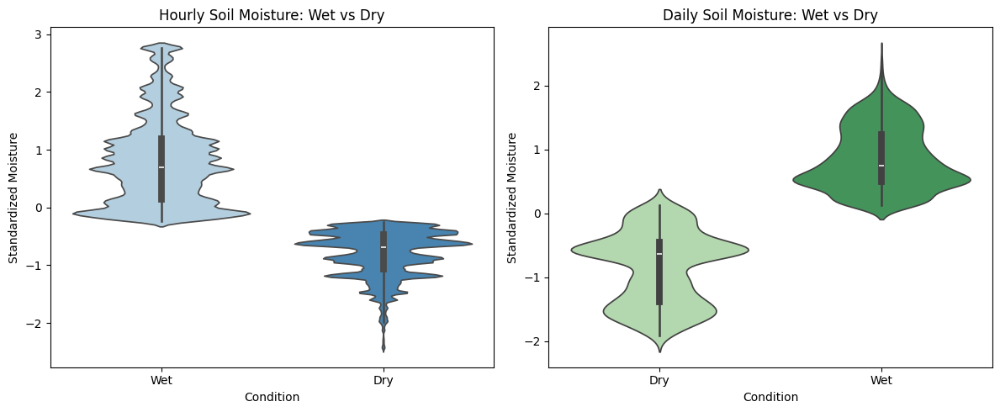

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to pick a numeric sensor column
def pick_sensor(df, numeric_cols):
    for col in numeric_cols:
        if col not in ["year", "month", "day", "hour"]:
            return col
    raise ValueError("No numeric sensor column found")

# Select representative sensors
hourly_sensor = pick_sensor(hourly_processed, hourly_numeric)
daily_sensor  = pick_sensor(daily_processed, daily_numeric)

# Label wet vs dry
def label_wet_dry(df, sensor):
    median_val = df[sensor].median()
    return df[sensor].apply(lambda x: "Wet" if x >= median_val else "Dry")

hourly_processed["wet_dry"] = label_wet_dry(hourly_processed, hourly_sensor)
daily_processed["wet_dry"]  = label_wet_dry(daily_processed, daily_sensor)

# Plot
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.violinplot(
    x="wet_dry",
    y=hourly_sensor,
    hue="wet_dry",
    data=hourly_processed,
    palette="Blues",
    dodge=False,
    legend=False
)
plt.title("Hourly Soil Moisture: Wet vs Dry")
plt.xlabel("Condition")
plt.ylabel("Standardized Moisture")

plt.subplot(1, 2, 2)
sns.violinplot(
    x="wet_dry",
    y=daily_sensor,
    hue="wet_dry",
    data=daily_processed,
    palette="Greens",
    dodge=False,
    legend=False
)
plt.title("Daily Soil Moisture: Wet vs Dry")
plt.xlabel("Condition")
plt.ylabel("Standardized Moisture")

plt.tight_layout()
plt.show()


# Sankey Diagram: Wet / Medium / Dry Across 4 Seasons

In [17]:
# ======================================
# Sankey Diagram: Wet / Medium / Dry Across 4 Seasons (DL-ready)
# ======================================

import pandas as pd
import plotly.graph_objects as go

# -------------------------------
# Helper functions
# -------------------------------

def pick_sensor(df, target_cols=None):
    """
    Pick a sensor (VW depth) automatically.
    By default, pick the first target column if not specified.
    """
    if target_cols is None:
        target_cols = [c for c in df.columns if "vw" in c]
    if not target_cols:
        raise ValueError("No VW target columns found in dataframe.")
    return target_cols[0]  # pick the first VW column

def month_to_season(month):
    """
    Convert month number (1-12) to meteorological season.
    """
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    elif month in [9, 10, 11]:
        return "Fall"
    else:
        return "Unknown"

# -------------------------------
# Prepare dataframe
# -------------------------------

df = hourly_df.copy()  # Use cleaned hourly_df

# Ensure month column exists
df["month"] = df["date"].dt.month

# Pick sensor automatically
sensor = pick_sensor(df)

# -------------------------------
# Categorize soil moisture
# -------------------------------
q1 = df[sensor].quantile(0.33)
q2 = df[sensor].quantile(0.66)

def moisture_category(x):
    if x <= q1:
        return "Dry"
    elif x <= q2:
        return "Medium"
    else:
        return "Wet"

df["moisture_cat"] = df[sensor].apply(moisture_category)

# -------------------------------
# Assign seasons
# -------------------------------
df["season"] = df["month"].apply(month_to_season)

# -------------------------------
# Build source → target pairs for Sankey
# -------------------------------
season_order = ["Winter", "Spring", "Summer", "Fall"]
pairs = []

for i in range(len(season_order)-1):
    s1 = season_order[i]
    s2 = season_order[i+1]

    df_s1 = df[df["season"] == s1].reset_index()
    df_s2 = df[df["season"] == s2].reset_index()

    min_len = min(len(df_s1), len(df_s2))
    for c1, c2 in zip(df_s1["moisture_cat"].iloc[:min_len],
                      df_s2["moisture_cat"].iloc[:min_len]):
        pairs.append((f"{s1}-{c1}", f"{s2}-{c2}"))

# Count occurrences
flow_counts = pd.Series(pairs).value_counts()

# -------------------------------
# Define Sankey nodes & links
# -------------------------------
labels = list(set([x[0] for x in flow_counts.index] + [x[1] for x in flow_counts.index]))
label_idx = {l:i for i,l in enumerate(labels)}

source = [label_idx[x[0]] for x in flow_counts.index]
target = [label_idx[x[1]] for x in flow_counts.index]
value  = flow_counts.values

# Node colors by season
season_colors = {
    "Winter": "rgba(135,206,250,0.8)",   # Light Blue
    "Spring": "rgba(144,238,144,0.8)",   # Light Green
    "Summer": "rgba(255,165,0,0.8)",     # Orange
    "Fall":   "rgba(255,99,71,0.8)"      # Tomato Red
}

node_colors = [season_colors.get(label.split("-")[0], "lightgray") for label in labels]

# -------------------------------
# Plot Sankey diagram
# -------------------------------
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color="rgba(100,100,150,0.4)"  # Slightly transparent
    )
)])

fig.update_layout(title_text=f"Seasonal Soil Moisture Flow ({sensor}): Dry / Medium / Wet", font_size=12)
fig.show()


# Year-wise Seasonal Pair Plots for Top Sensors (DL-ready)

Sensor columns used for pair plots: ['location', 'vw_30cm', 'vw_60cm', 'vw_90cm', 'vw_120cm', 'vw_150cm']


<Figure size 1200x1200 with 0 Axes>

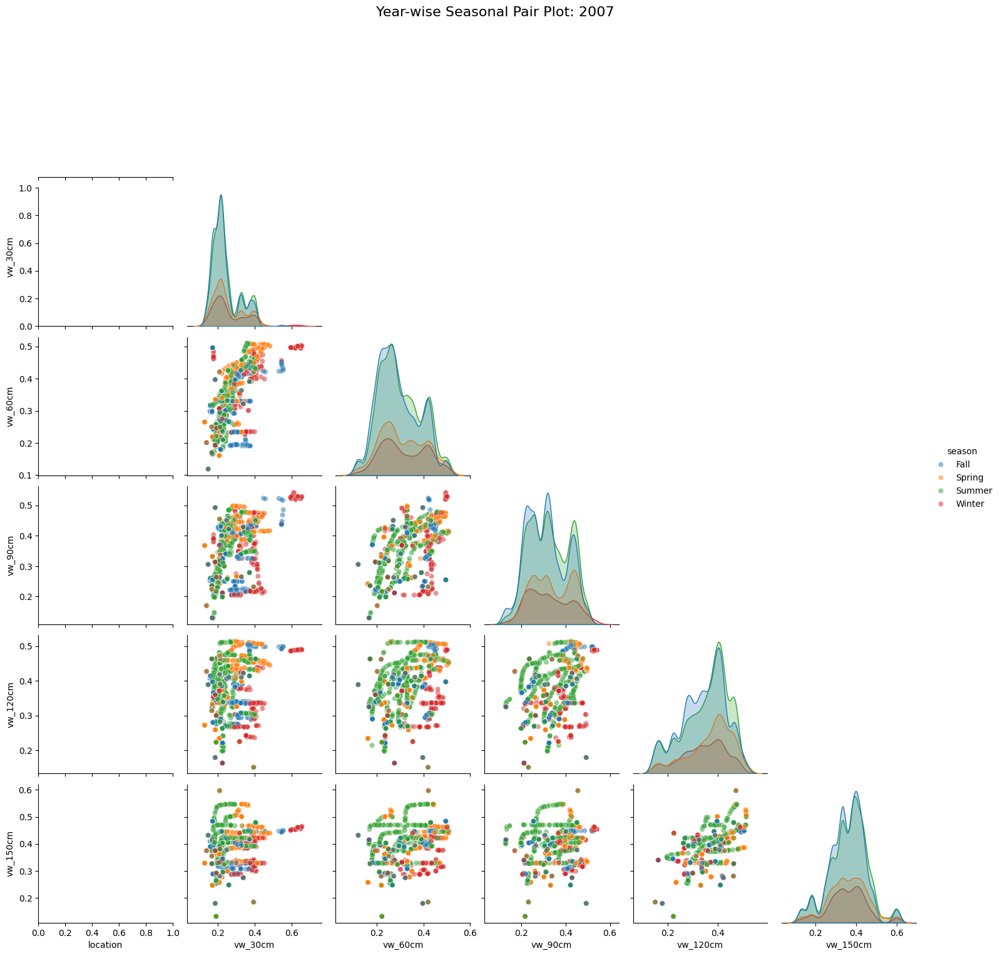

<Figure size 1200x1200 with 0 Axes>

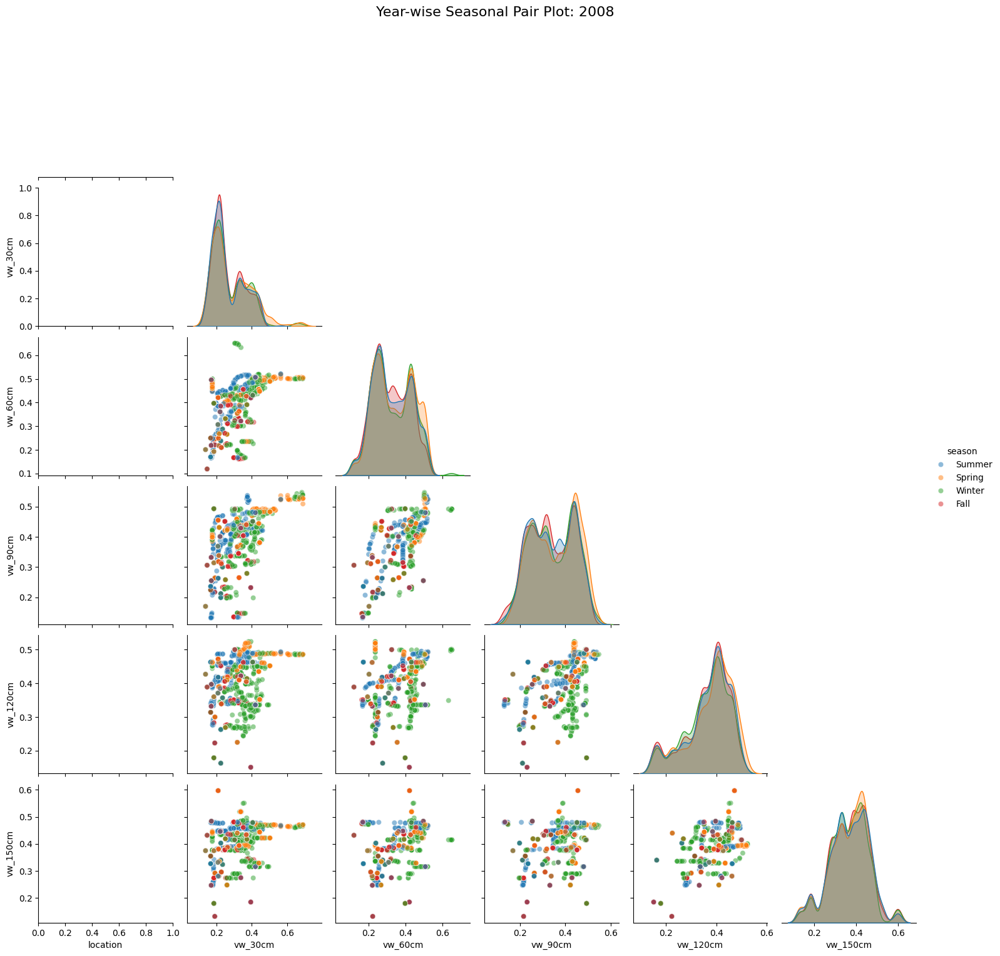

<Figure size 1200x1200 with 0 Axes>

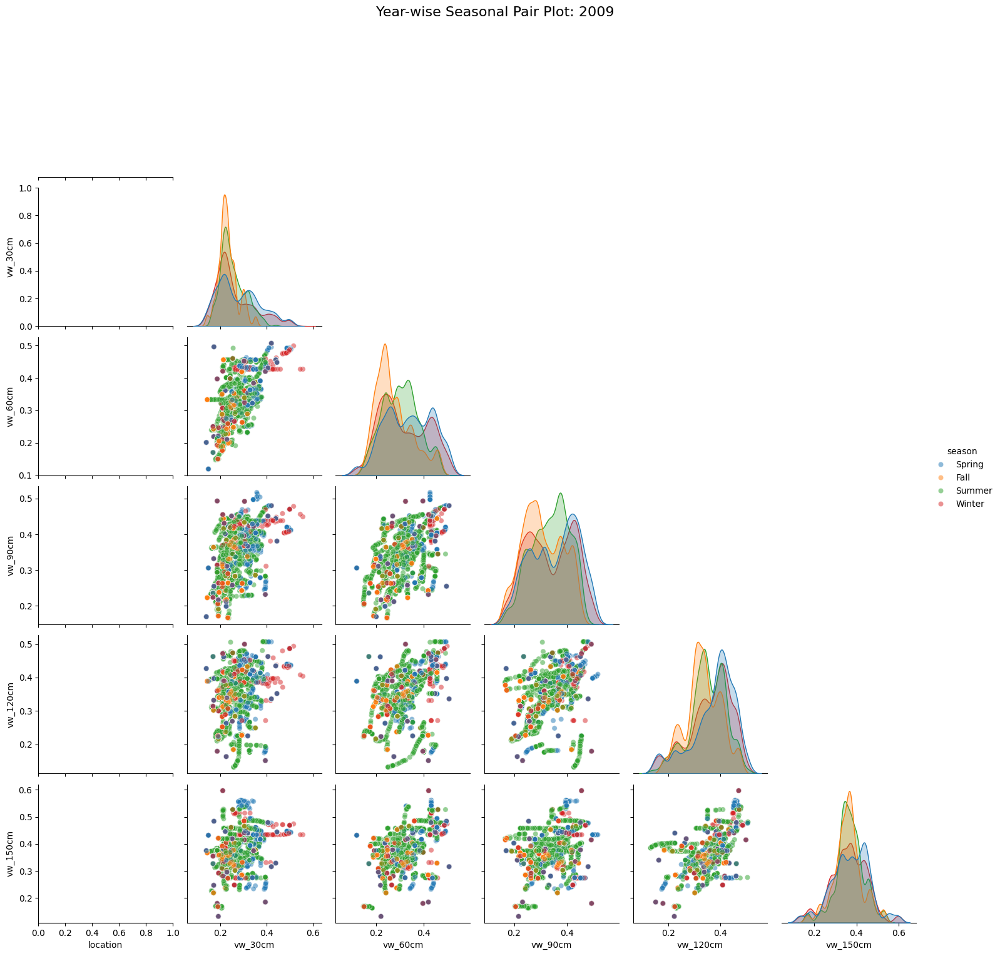

<Figure size 1200x1200 with 0 Axes>

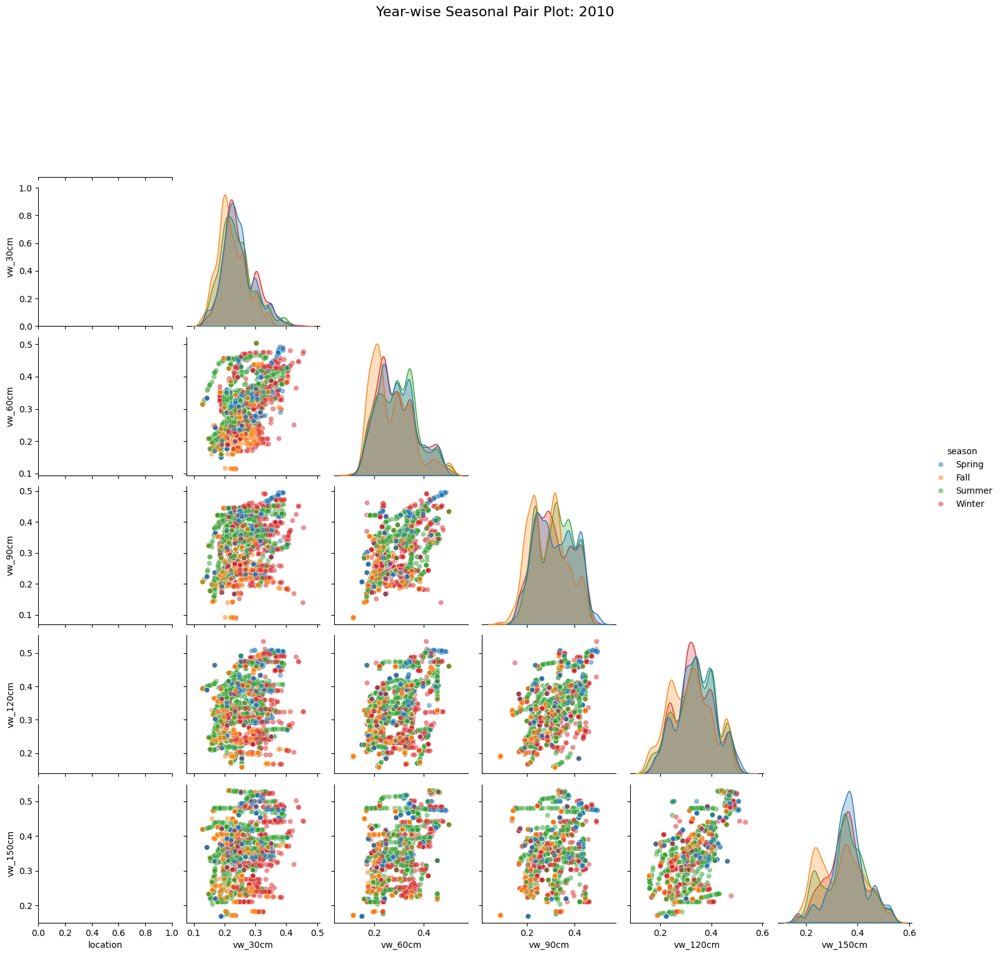

<Figure size 1200x1200 with 0 Axes>

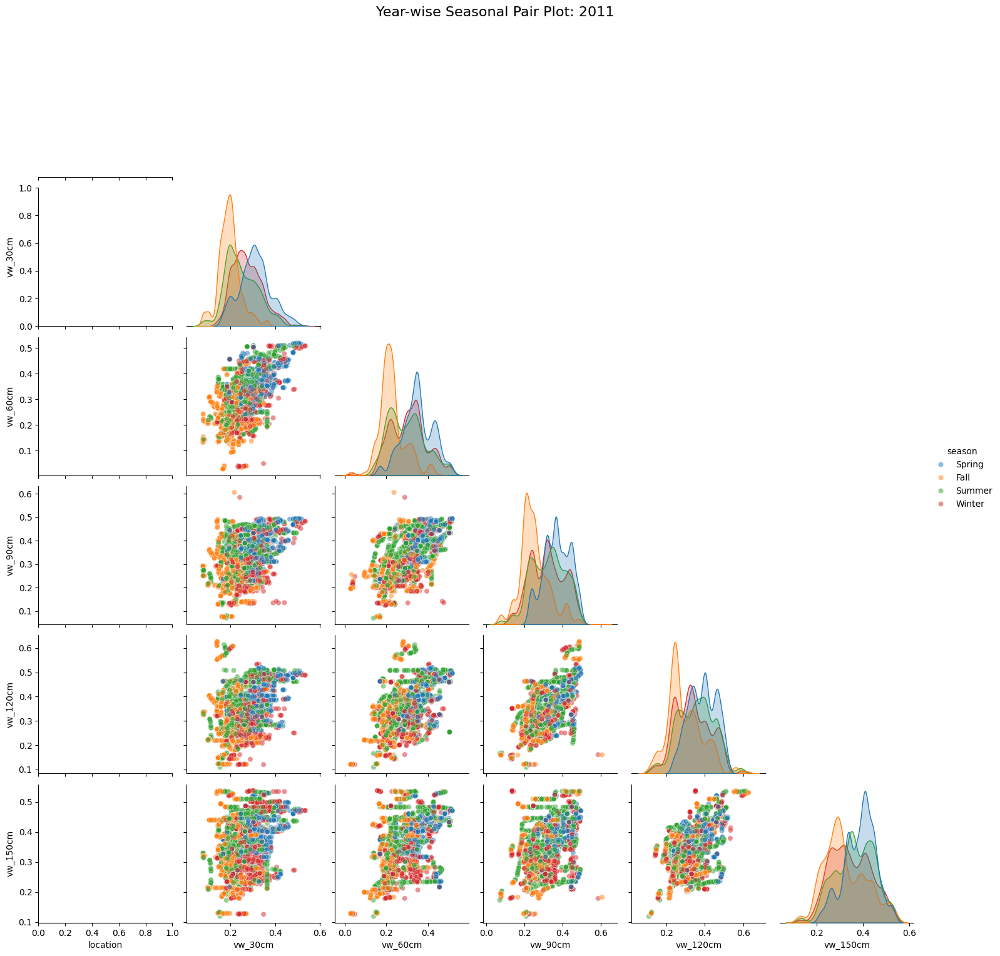

<Figure size 1200x1200 with 0 Axes>

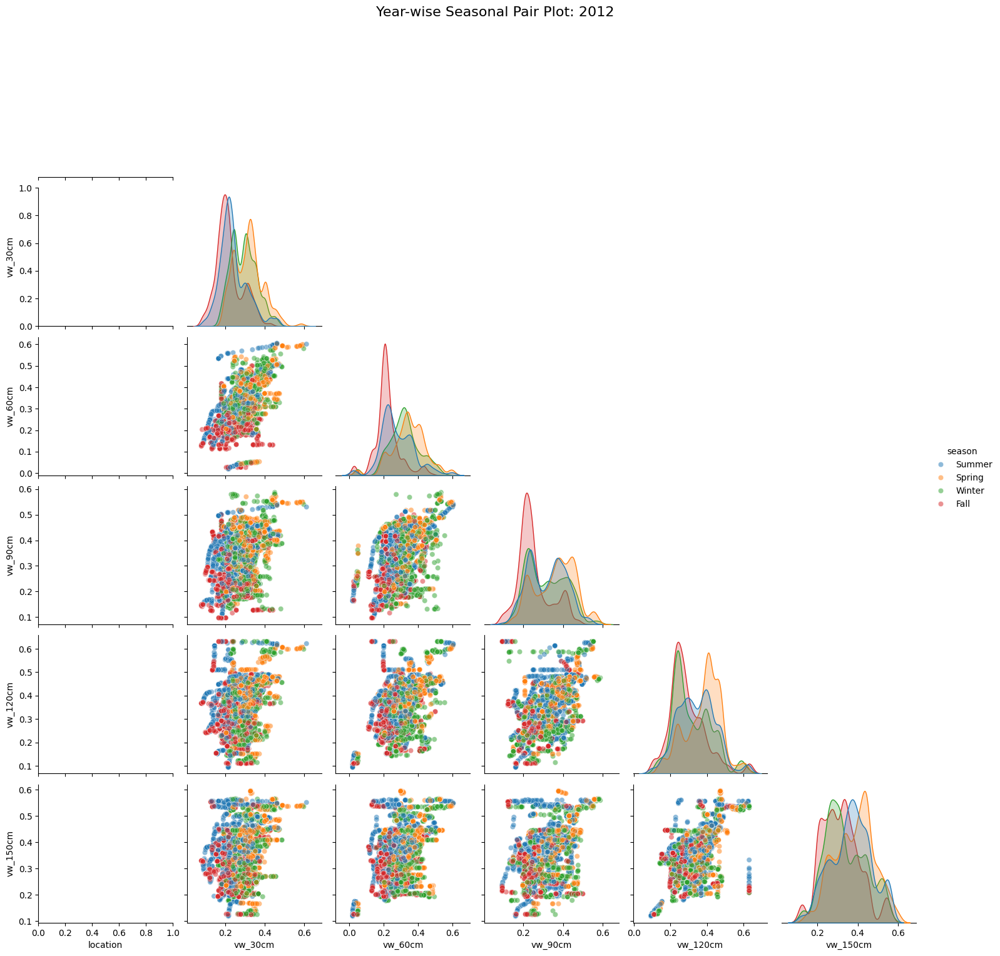

<Figure size 1200x1200 with 0 Axes>

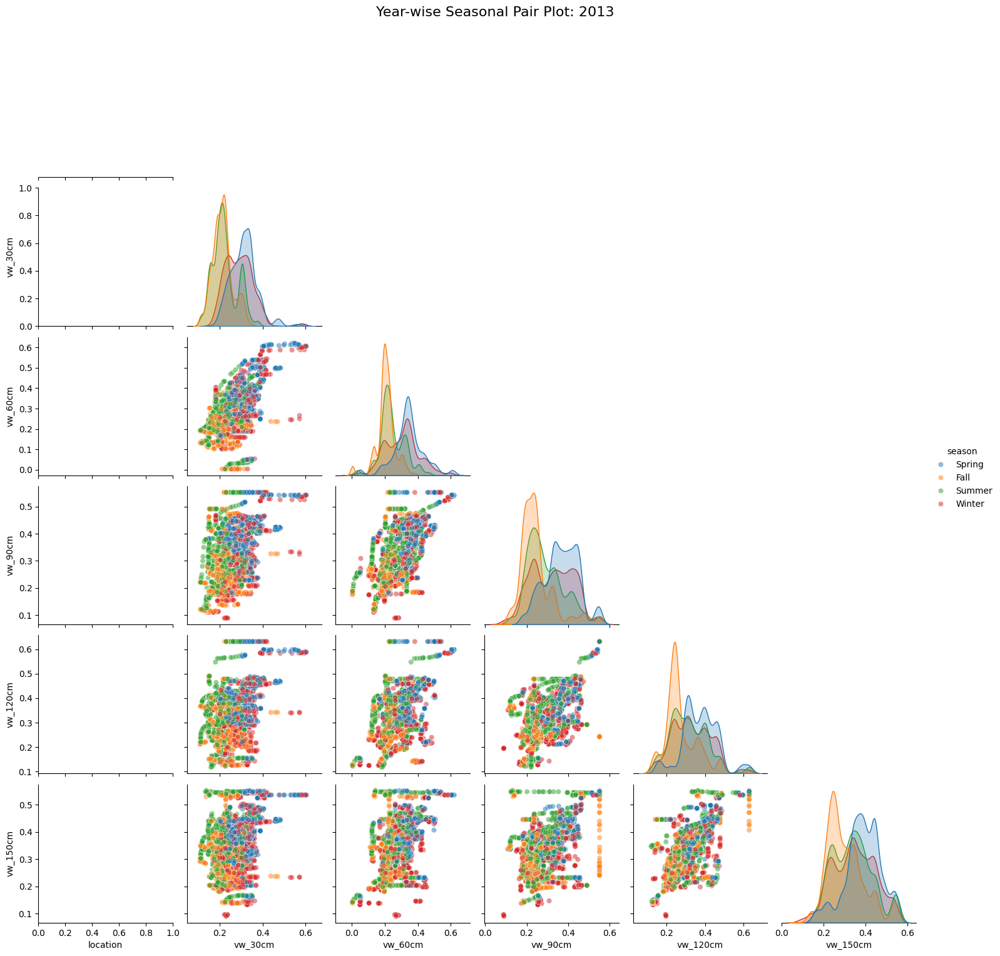

<Figure size 1200x1200 with 0 Axes>

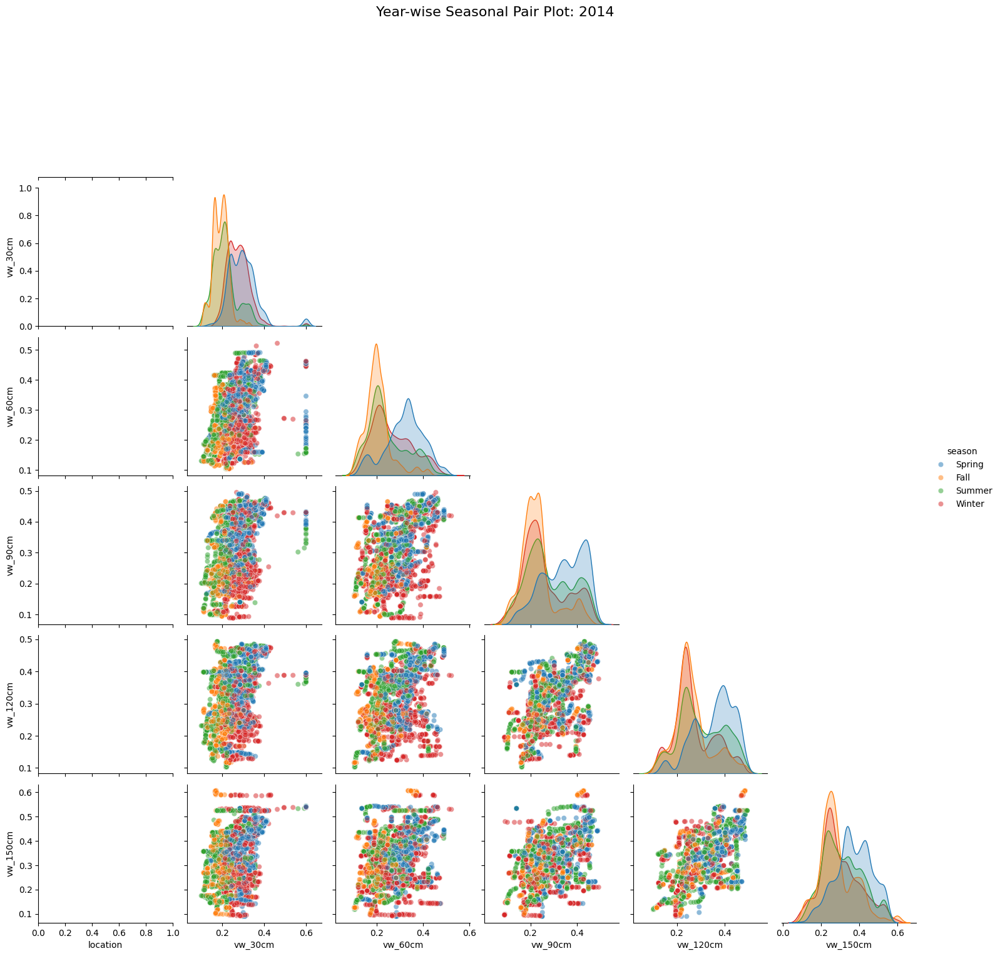

<Figure size 1200x1200 with 0 Axes>

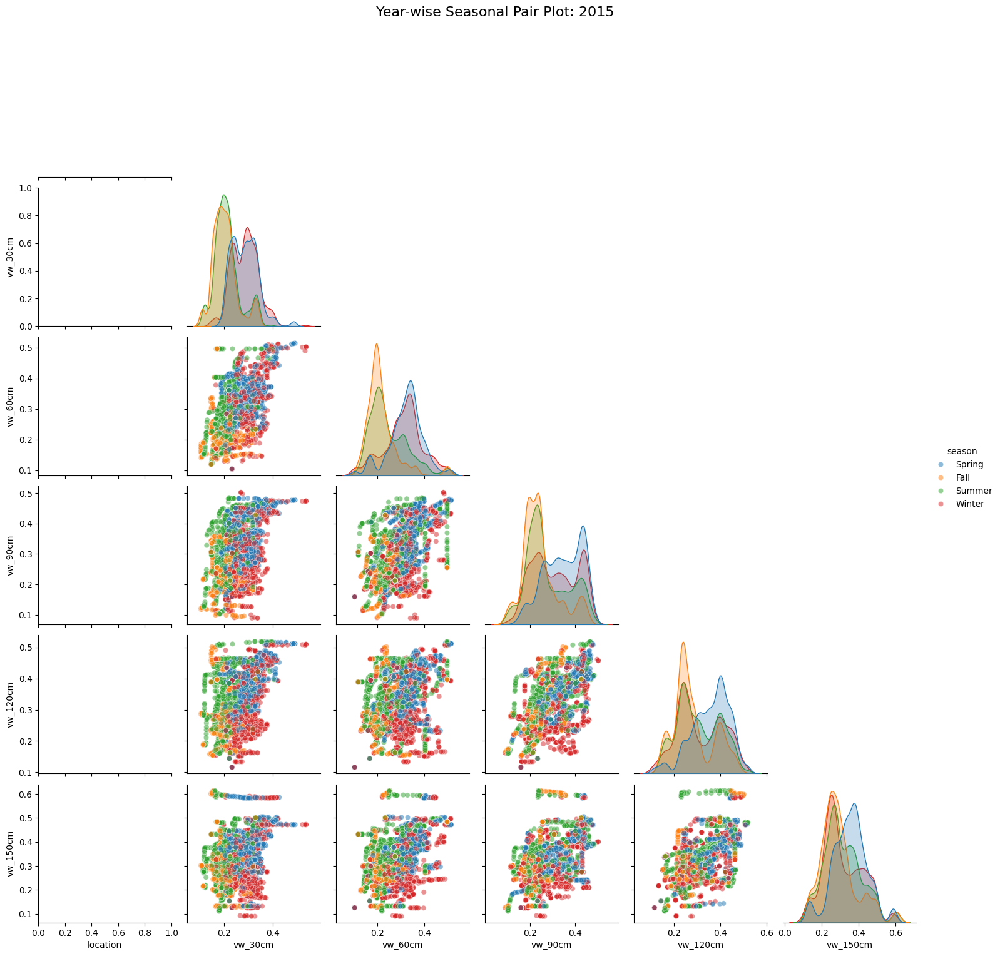

<Figure size 1200x1200 with 0 Axes>

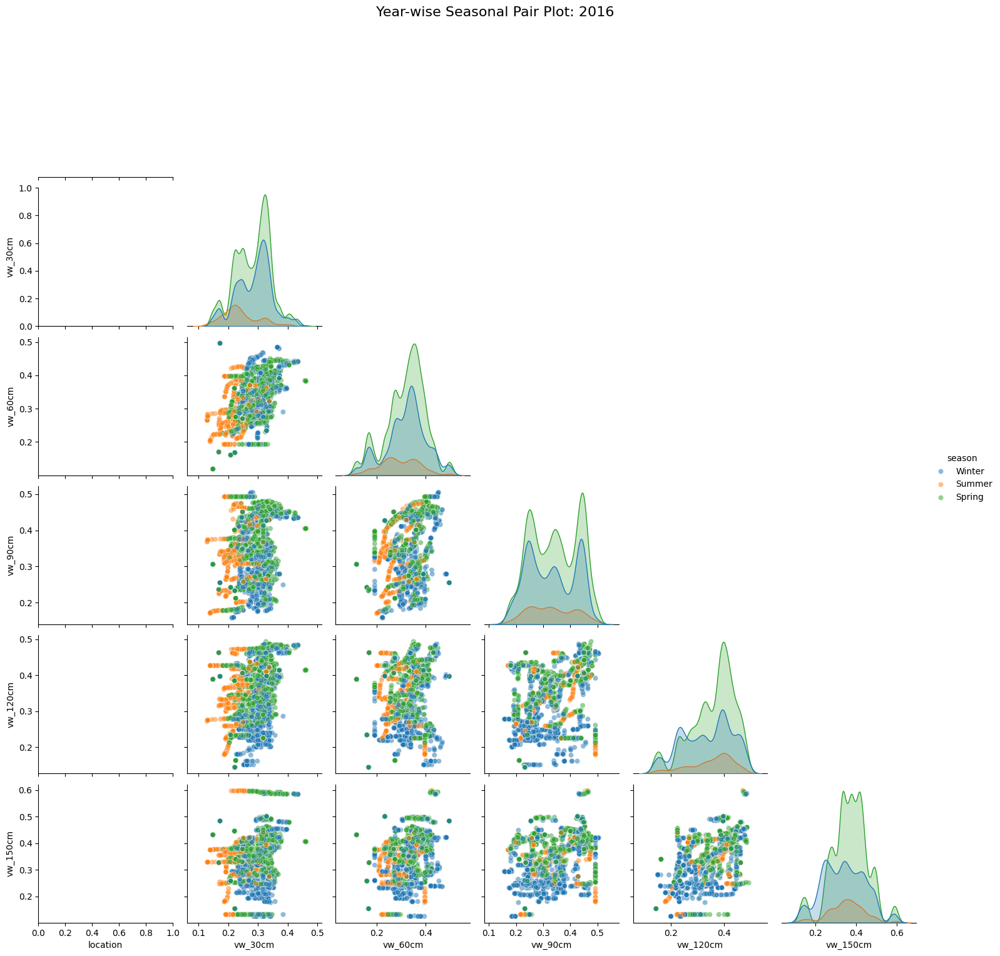

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# -------------------------------
# Prepare DataFrame
# -------------------------------
df = hourly_df.copy()  # Use cleaned DL-ready hourly dataset

# Ensure 'month' column exists
if "month" not in df.columns:
    df["month"] = df["date"].dt.month

# Assign seasons
def month_to_season(m):
    if m in [12, 1, 2]: 
        return "Winter"
    elif m in [3, 4, 5]: 
        return "Spring"
    elif m in [6, 7, 8]: 
        return "Summer"
    else: 
        return "Fall"

df["season"] = df["month"].apply(month_to_season)

# Ensure 'year' column exists
if "year" not in df.columns:
    df["year"] = df["date"].dt.year

# -------------------------------
# Detect sensor columns
# -------------------------------
def get_sensor_columns(df):
    """
    Select numeric columns suitable as sensors (exclude date/time columns)
    """
    exclude = ["year", "month", "day", "hour", "minute", "second"]
    return [c for c in df.columns if df[c].dtype in ["int64", "float64"] 
            and all(e not in c.lower() for e in exclude)]

sensor_cols = get_sensor_columns(df)

# Limit to top 6 sensors for speed
if len(sensor_cols) > 6:
    sensor_cols = sensor_cols[:6]

print("Sensor columns used for pair plots:", sensor_cols)

# -------------------------------
# Loop through each year and plot
# -------------------------------
years = sorted(df["year"].unique())

for yr in years:
    df_year = df[df["year"] == yr]

    # Sample to reduce plotting time (max 10,000 rows)
    df_sample = df_year.sample(n=min(10000, len(df_year)), random_state=42)

    plt.figure(figsize=(12, 12))
    sns.pairplot(
        df_sample, 
        vars=sensor_cols, 
        hue="season", 
        diag_kind="kde", 
        corner=True, 
        plot_kws={'alpha': 0.5}
    )
    plt.suptitle(f"Year-wise Seasonal Pair Plot: {yr}", y=1.02, fontsize=16)
    plt.show()


# Year-wise Seasonal Sensor Correlation Heatmaps

Sensor columns used for correlation heatmaps: ['location', 'vw_30cm', 'vw_60cm', 'vw_90cm', 'vw_120cm', 'vw_150cm', 't_30cm', 't_60cm', 't_90cm', 't_120cm']


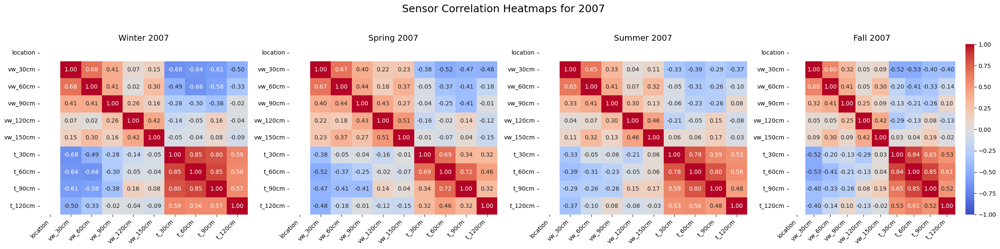

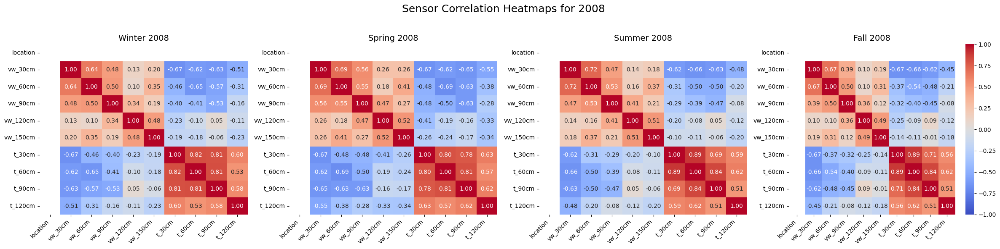

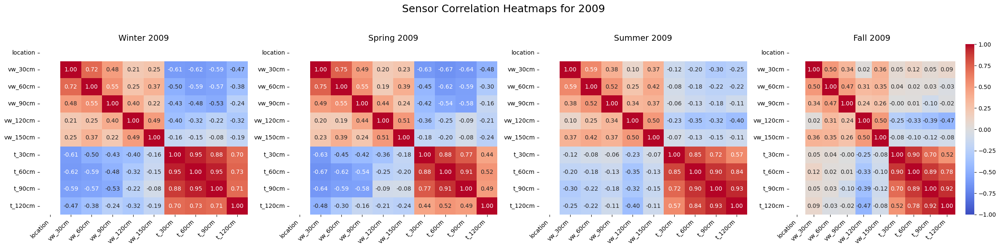

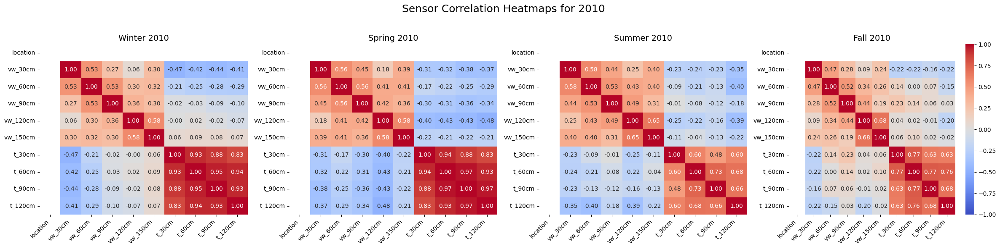

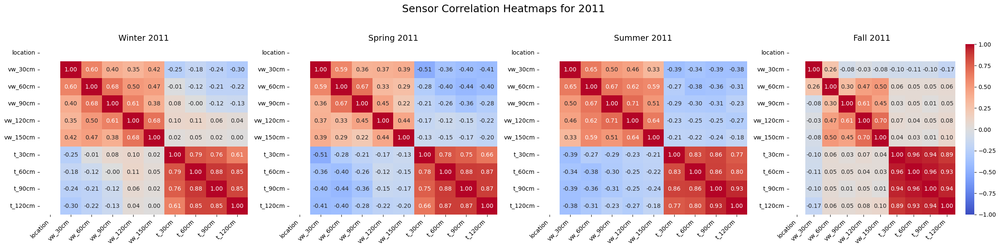

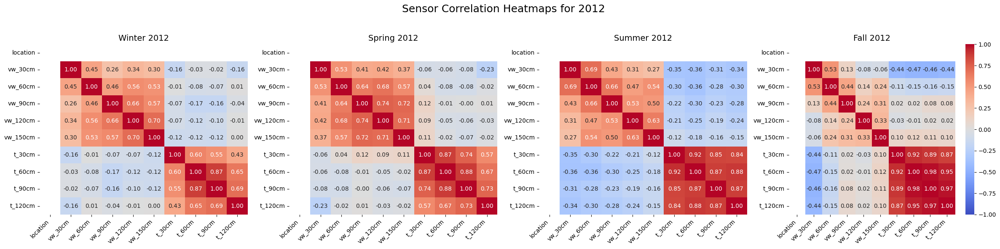

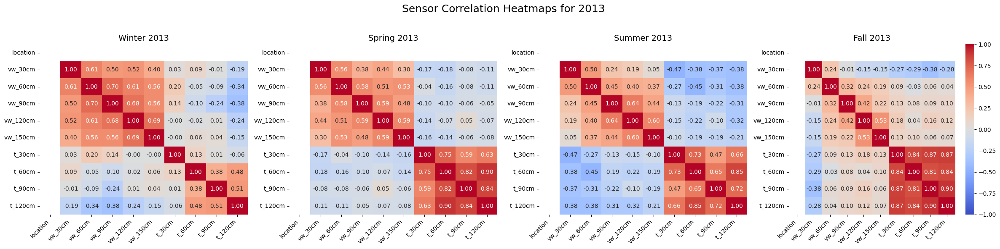

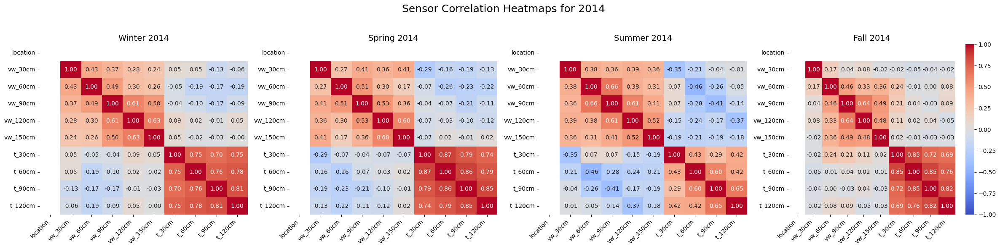

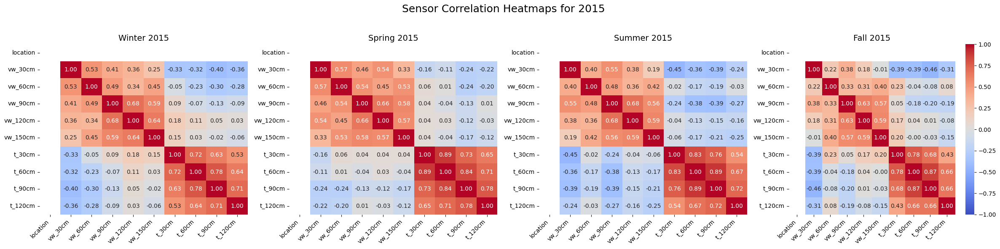

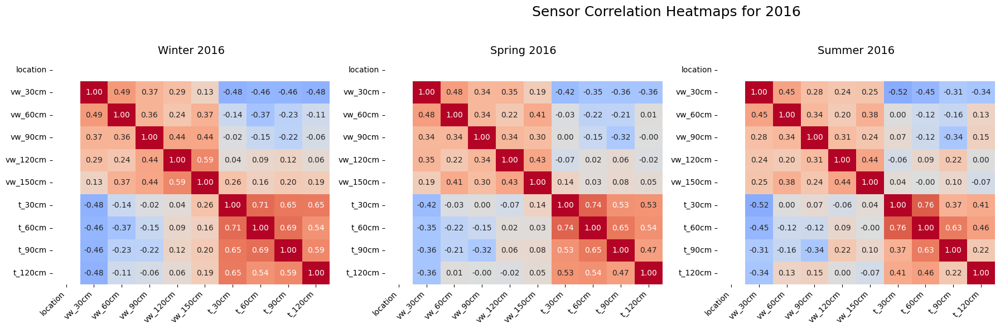

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# -------------------------------
# Prepare DataFrame
# -------------------------------
df = hourly_df.copy()  # Use cleaned DL-ready hourly dataset

# Ensure 'month' column exists
if "month" not in df.columns:
    df["month"] = df["date"].dt.month

# Ensure 'year' column exists
if "year" not in df.columns:
    df["year"] = df["date"].dt.year

# Assign seasons
def month_to_season(m):
    if m in [12, 1, 2]: 
        return "Winter"
    elif m in [3, 4, 5]: 
        return "Spring"
    elif m in [6, 7, 8]: 
        return "Summer"
    else: 
        return "Fall"

if "season" not in df.columns:
    df["season"] = df["month"].apply(month_to_season)

# -------------------------------
# Detect numeric sensor columns
# -------------------------------
def get_sensor_columns(df):
    exclude = ["year", "month", "day", "hour", "minute", "second"]
    return [c for c in df.columns if df[c].dtype in ["int64", "float64"] 
            and all(e not in c.lower() for e in exclude)]

sensor_cols = get_sensor_columns(df)

# Limit to top 10 sensors for clarity
if len(sensor_cols) > 10:
    sensor_cols = sensor_cols[:10]

print("Sensor columns used for correlation heatmaps:", sensor_cols)

# -------------------------------
# Plot seasonal correlation heatmaps per year
# -------------------------------
years = sorted(df["year"].unique())
seasons = ["Winter", "Spring", "Summer", "Fall"]

for yr in years:
    plt.figure(figsize=(24, 6))  # Wide figure for clarity
    for i, season in enumerate(seasons, 1):
        df_sub = df[(df["year"] == yr) & (df["season"] == season)]
        if len(df_sub) < 2:
            continue  # Skip if not enough data

        # Compute correlation
        corr = df_sub[sensor_cols].corr()

        plt.subplot(1, 4, i)
        sns.heatmap(
            corr, annot=True, fmt=".2f", cmap="coolwarm",
            cbar=(i == 4), vmin=-1, vmax=1, annot_kws={"size": 10}
        )
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.yticks(rotation=0, fontsize=10)
        plt.title(f"{season} {yr}", fontsize=14)

    plt.suptitle(f"Sensor Correlation Heatmaps for {yr}", fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
